In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 192), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  615.178 2.80946 0.292681


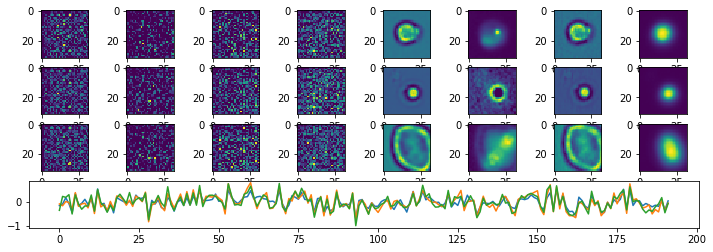

Epoch:  1 Iteration:  0 Loss:  18.051 0.637783 0.00192687


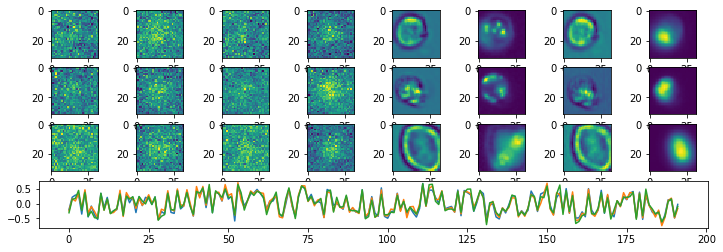

Epoch:  2 Iteration:  0 Loss:  15.624 0.63633 0.000927478


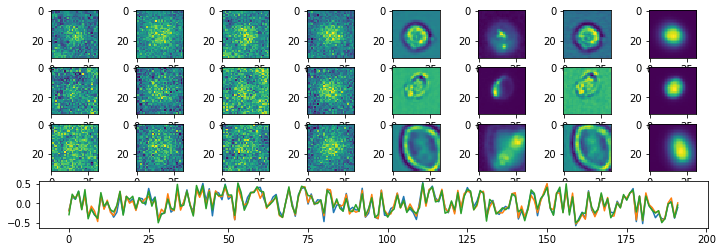

Epoch:  3 Iteration:  0 Loss:  14.3187 0.635699 0.0028021


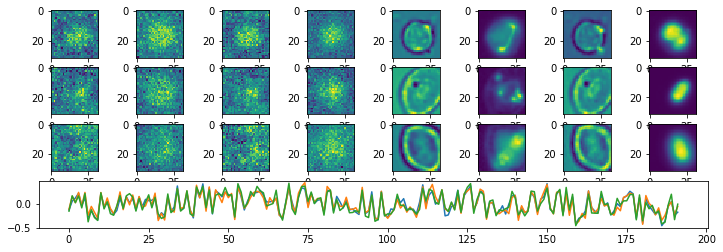

Epoch:  4 Iteration:  0 Loss:  12.2994 0.634634 0.0024752


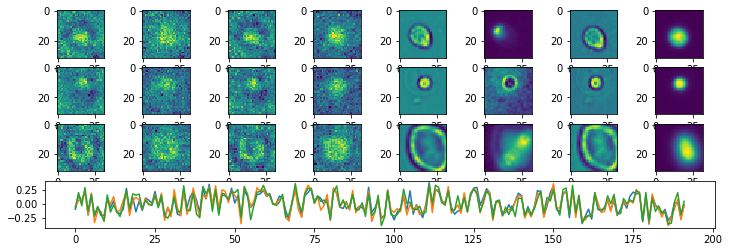

Epoch:  5 Iteration:  0 Loss:  10.9439 0.633922 0.00185102


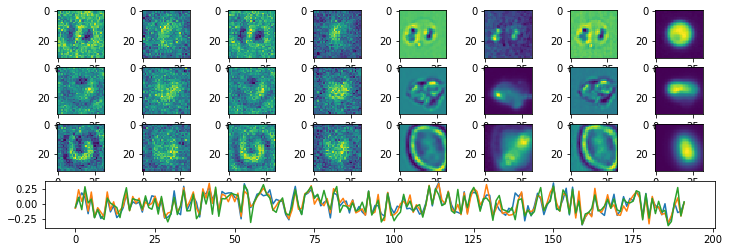

Epoch:  6 Iteration:  0 Loss:  9.98245 0.633418 0.0015969


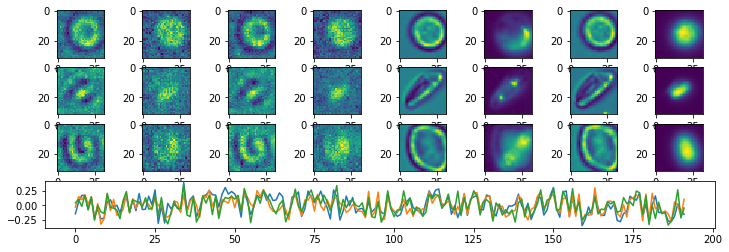

Epoch:  7 Iteration:  0 Loss:  9.1119 0.632946 0.00119123


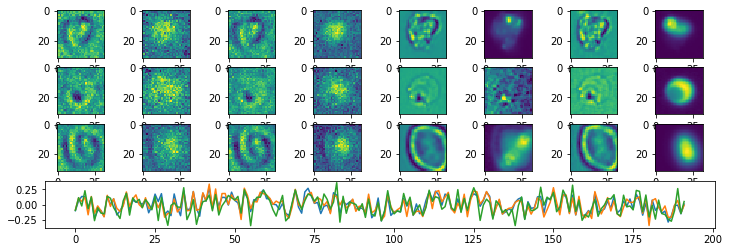

Epoch:  8 Iteration:  0 Loss:  9.28185 0.633041 0.00249147


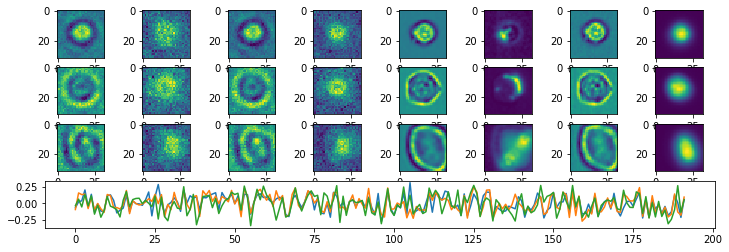

Epoch:  9 Iteration:  0 Loss:  7.8622 0.632291 0.00179377


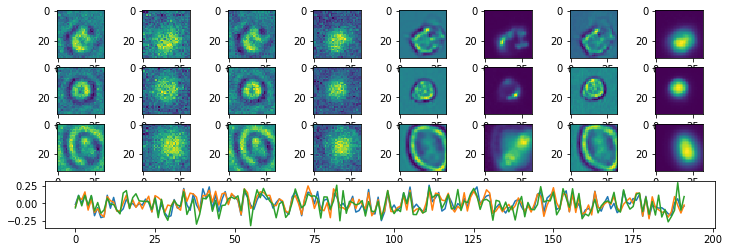

Epoch:  10 Iteration:  0 Loss:  7.42256 0.63206 0.00107428


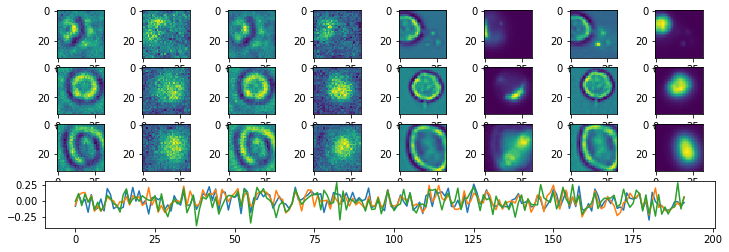

Epoch:  11 Iteration:  0 Loss:  7.16307 0.631928 0.00157368


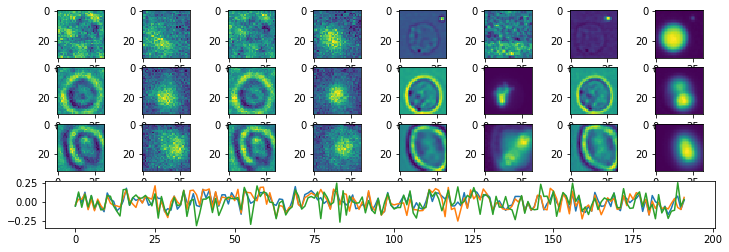

Epoch:  12 Iteration:  0 Loss:  6.74253 0.631703 0.00134581


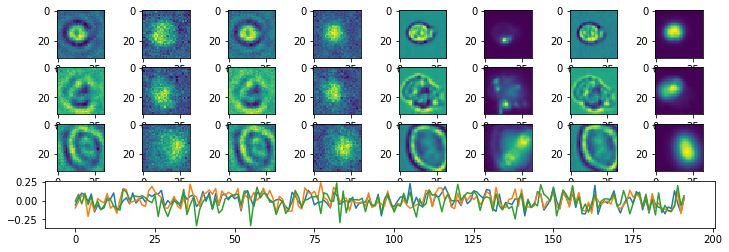

Epoch:  13 Iteration:  0 Loss:  6.45634 0.631552 0.000807971


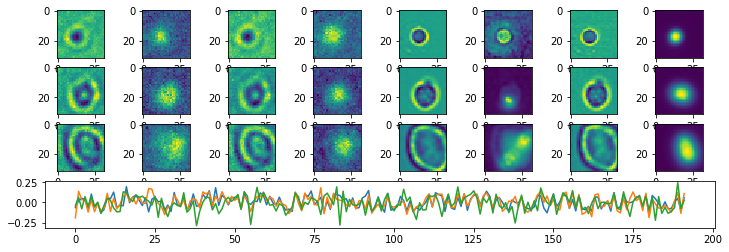

Epoch:  14 Iteration:  0 Loss:  6.23804 0.631439 0.000877082


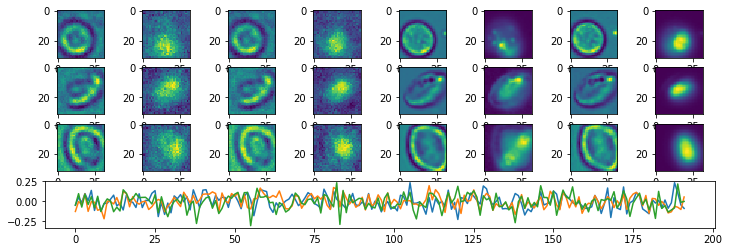

Epoch:  15 Iteration:  0 Loss:  6.05386 0.631342 0.000313222


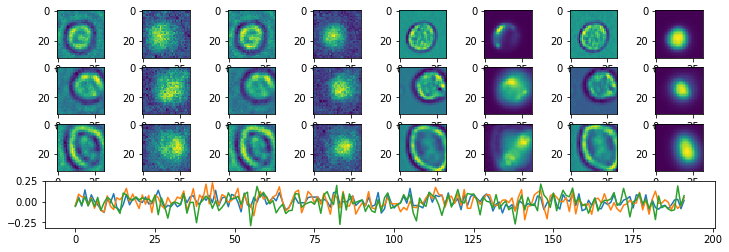

Epoch:  16 Iteration:  0 Loss:  5.96875 0.631299 0.00127196


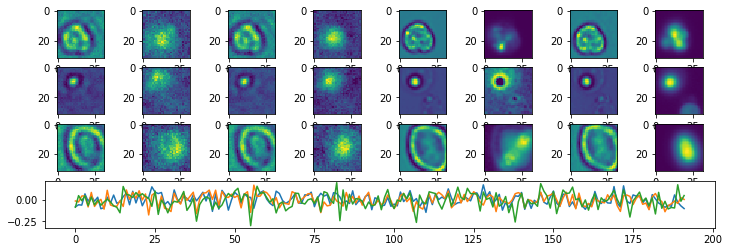

Epoch:  17 Iteration:  0 Loss:  5.76293 0.63119 0.00121284


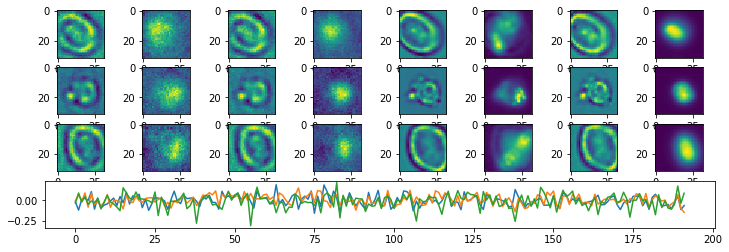

Epoch:  18 Iteration:  0 Loss:  5.50661 0.631054 0.000861079


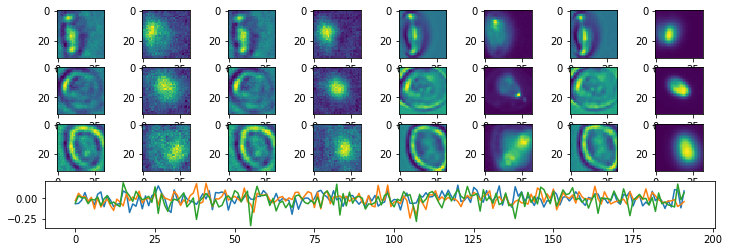

Epoch:  19 Iteration:  0 Loss:  5.3028 0.630942 0.000754237


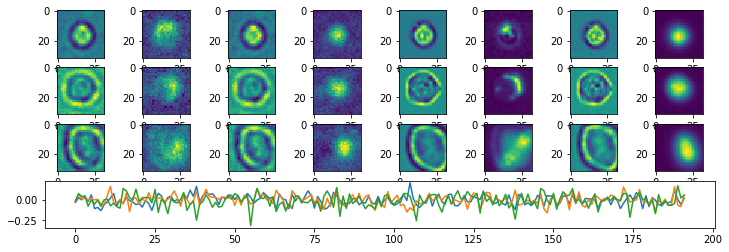

Epoch:  20 Iteration:  0 Loss:  5.13696 0.630853 0.000876099


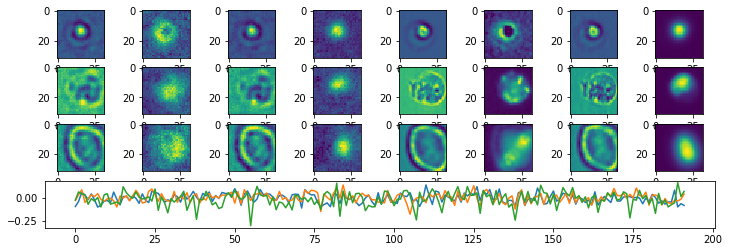

Epoch:  21 Iteration:  0 Loss:  4.97506 0.630768 0.000848114


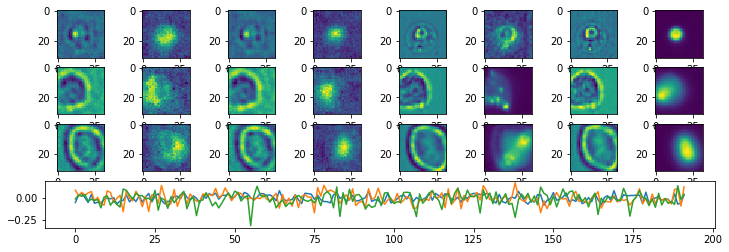

Epoch:  22 Iteration:  0 Loss:  4.86143 0.630708 0.000809163


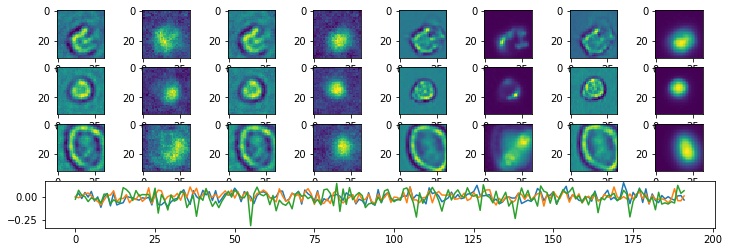

Epoch:  23 Iteration:  0 Loss:  4.74807 0.630649 0.000878543


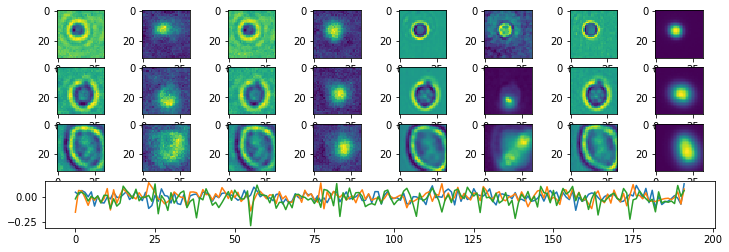

Epoch:  24 Iteration:  0 Loss:  4.66262 0.630602 0.00110471


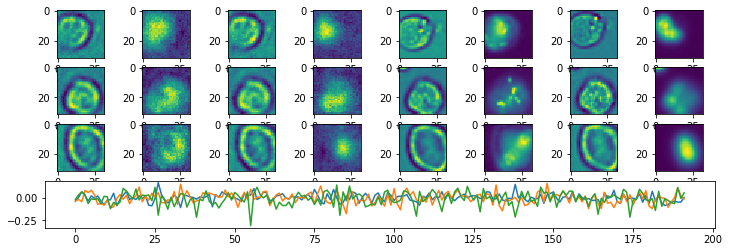

Epoch:  25 Iteration:  0 Loss:  4.55695 0.630548 0.000926584


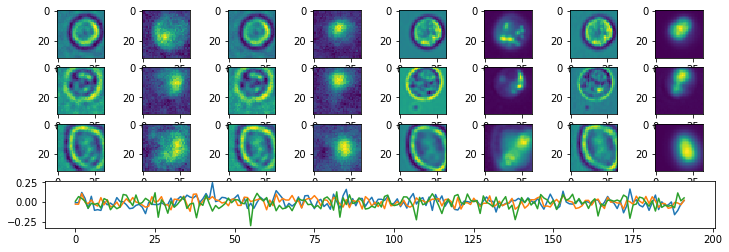

Epoch:  26 Iteration:  0 Loss:  4.48367 0.630511 0.000636339


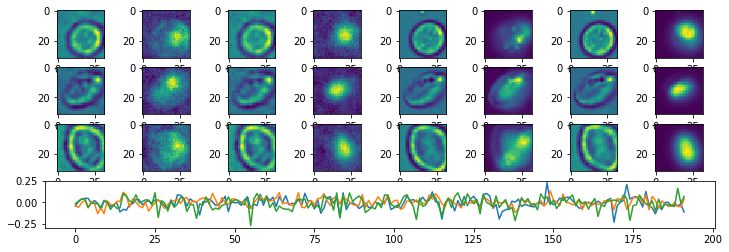

Epoch:  27 Iteration:  0 Loss:  4.32772 0.630427 0.00058642


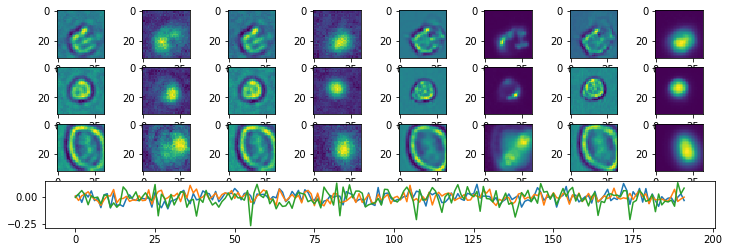

Epoch:  28 Iteration:  0 Loss:  4.30354 0.630412 0.000685692


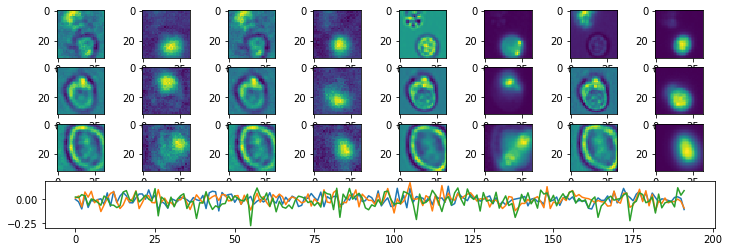

Epoch:  29 Iteration:  0 Loss:  4.20505 0.630361 0.000890255


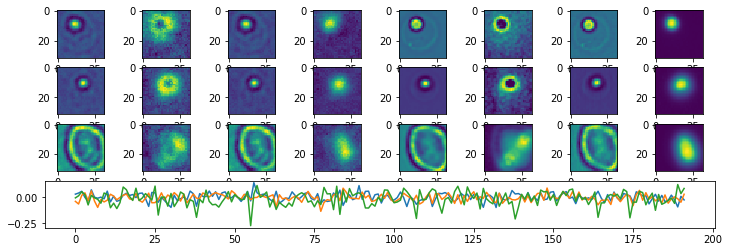

Epoch:  30 Iteration:  0 Loss:  4.11876 0.630316 0.000401139


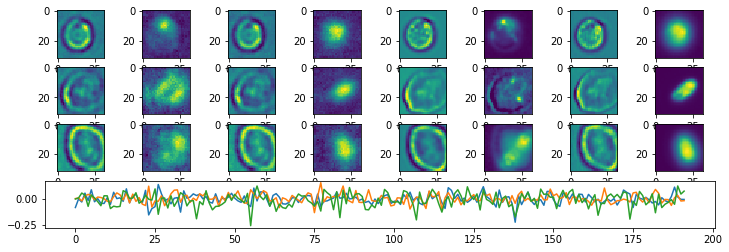

Epoch:  31 Iteration:  0 Loss:  4.07306 0.630293 0.000616103


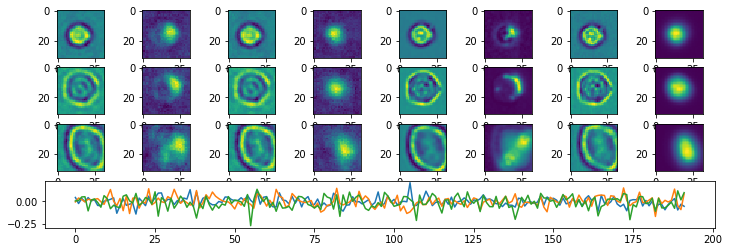

Epoch:  32 Iteration:  0 Loss:  3.99719 0.630253 0.000719398


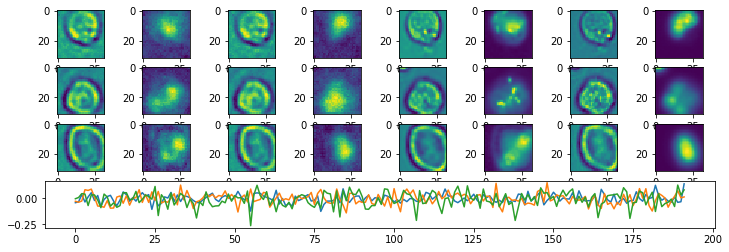

Epoch:  33 Iteration:  0 Loss:  3.93517 0.630221 0.000624806


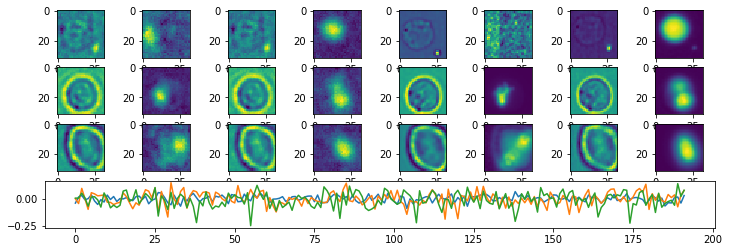

Epoch:  34 Iteration:  0 Loss:  3.89428 0.630199 0.000759512


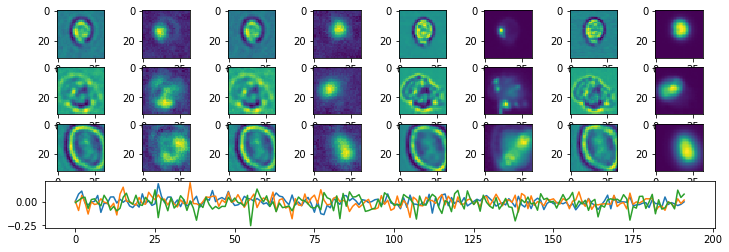

Epoch:  35 Iteration:  0 Loss:  3.83112 0.630165 0.000574082


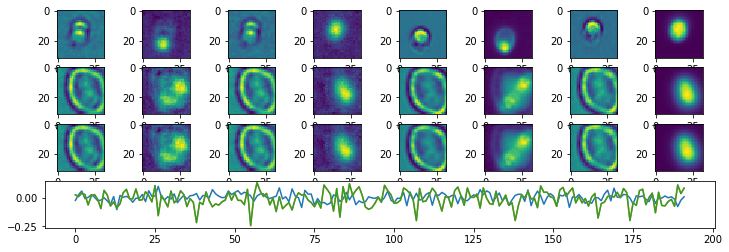

Epoch:  36 Iteration:  0 Loss:  3.78202 0.630141 0.000578761


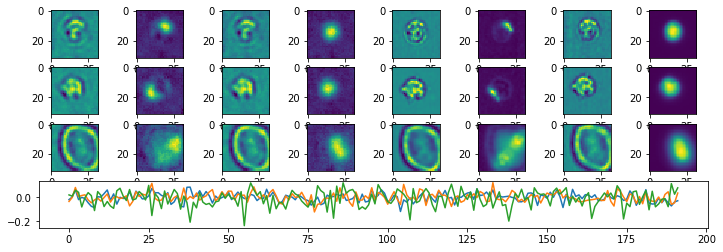

Epoch:  37 Iteration:  0 Loss:  3.76537 0.630132 0.000655353


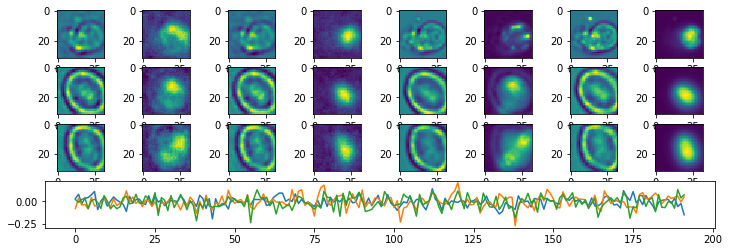

Epoch:  38 Iteration:  0 Loss:  3.70895 0.630101 0.000574738


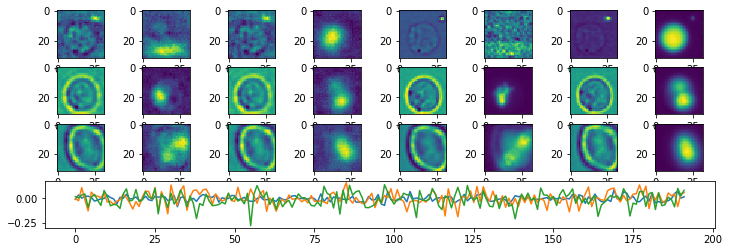

Epoch:  39 Iteration:  0 Loss:  3.68207 0.630088 0.000669181


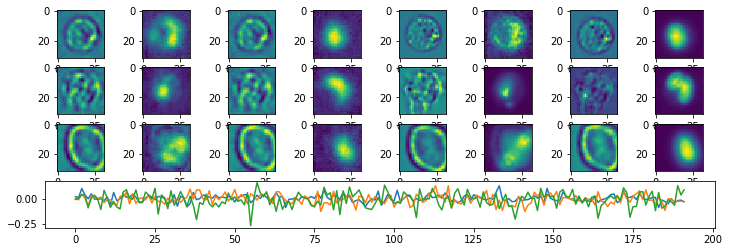

Epoch:  40 Iteration:  0 Loss:  3.63291 0.630062 0.000359446


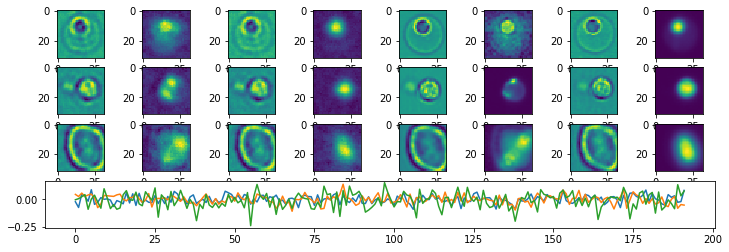

Epoch:  41 Iteration:  0 Loss:  3.55995 0.630024 0.000365883


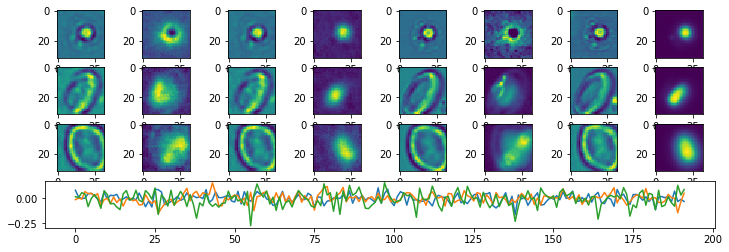

Epoch:  42 Iteration:  0 Loss:  3.48237 0.629983 0.000576913


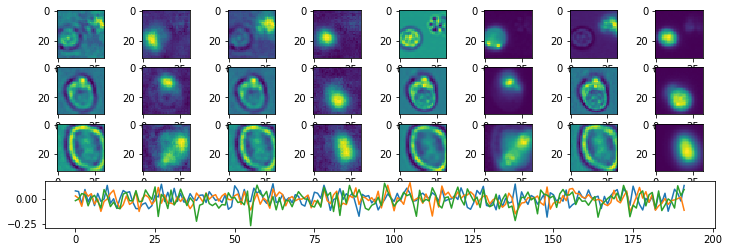

Epoch:  43 Iteration:  0 Loss:  3.47582 0.62998 0.000947416


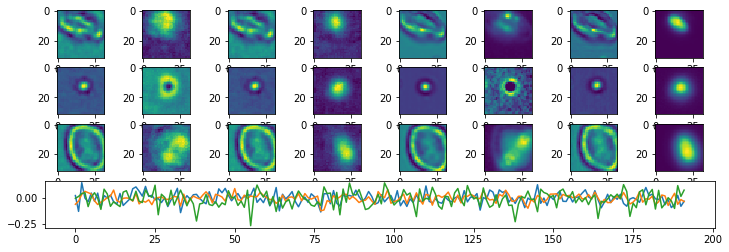

Epoch:  44 Iteration:  0 Loss:  3.41917 0.62995 0.000810474


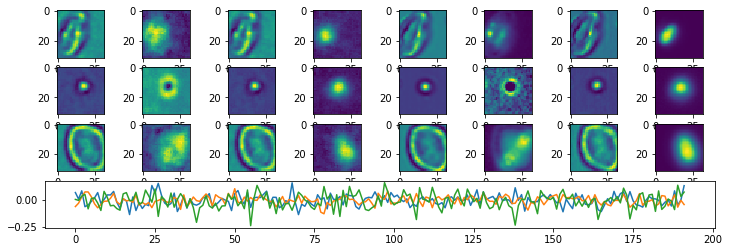

Epoch:  45 Iteration:  0 Loss:  3.38372 0.629933 0.000452638


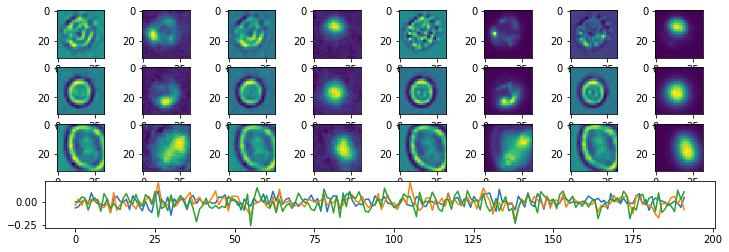

Epoch:  46 Iteration:  0 Loss:  3.33648 0.629907 0.000429839


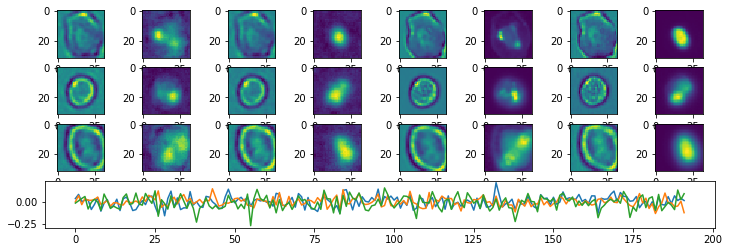

Epoch:  47 Iteration:  0 Loss:  3.34586 0.629915 0.000470132


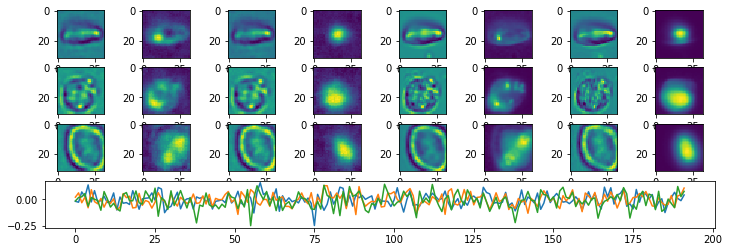

Epoch:  48 Iteration:  0 Loss:  3.34725 0.629913 0.00102127


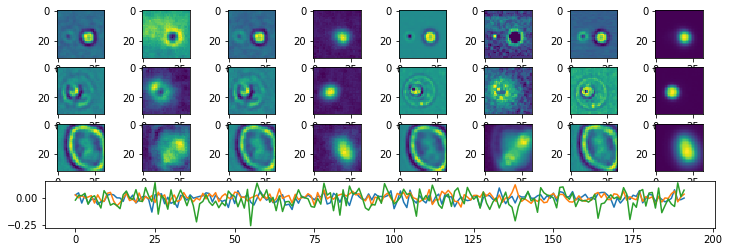

Epoch:  49 Iteration:  0 Loss:  3.252 0.629865 0.000691086


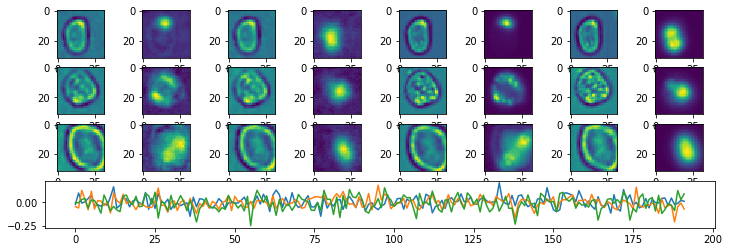

Epoch:  50 Iteration:  0 Loss:  3.20954 0.629843 0.000235707


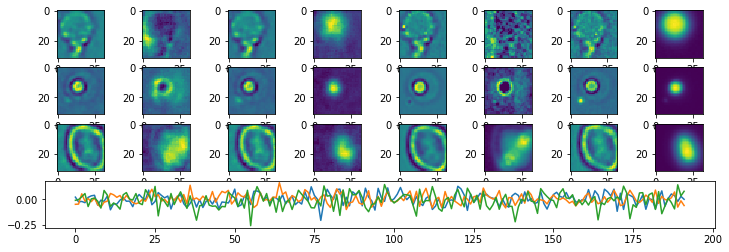

Epoch:  51 Iteration:  0 Loss:  3.19587 0.629835 0.000494152


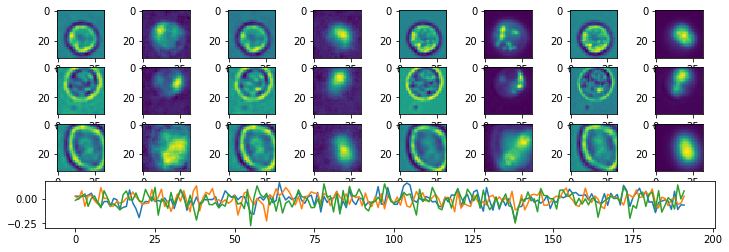

Epoch:  52 Iteration:  0 Loss:  3.17057 0.629822 0.000550181


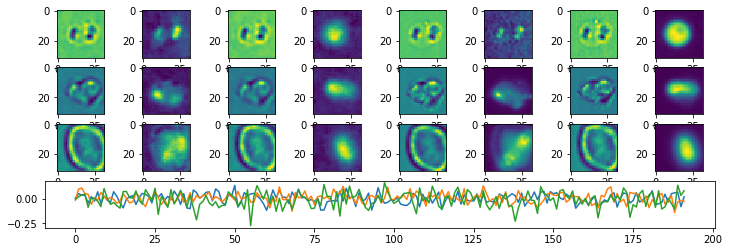

Epoch:  53 Iteration:  0 Loss:  3.14321 0.629808 0.000481963


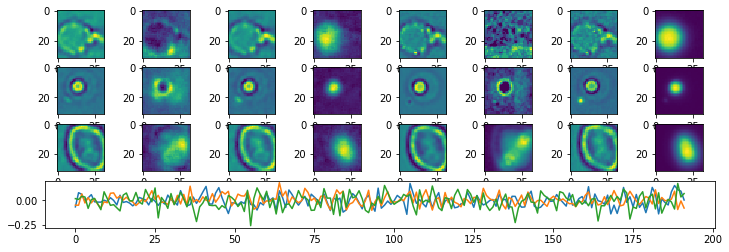

Epoch:  54 Iteration:  0 Loss:  3.12622 0.629799 0.000769287


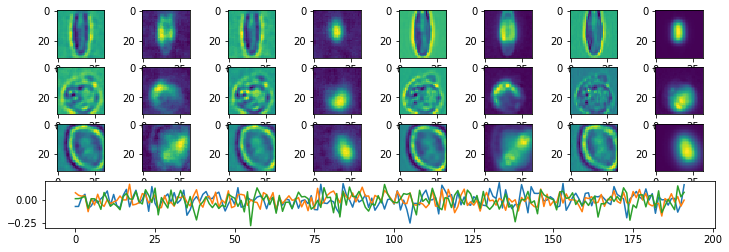

Epoch:  55 Iteration:  0 Loss:  3.12349 0.629799 0.00101194


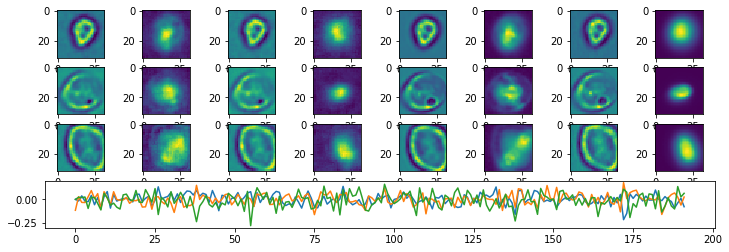

Epoch:  56 Iteration:  0 Loss:  3.04751 0.629759 0.000368029


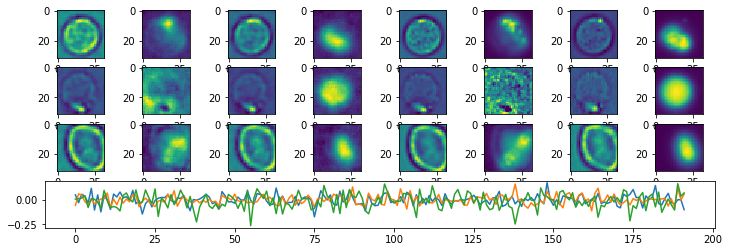

Epoch:  57 Iteration:  0 Loss:  3.0528 0.629761 0.000279695


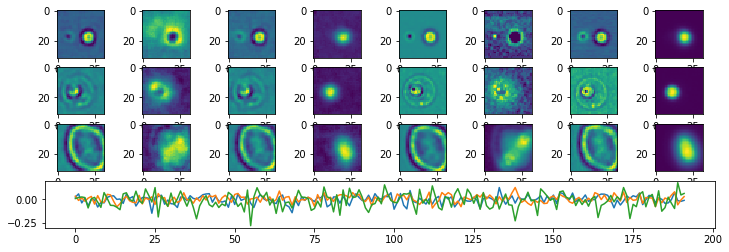

Epoch:  58 Iteration:  0 Loss:  3.00448 0.629737 0.000353038


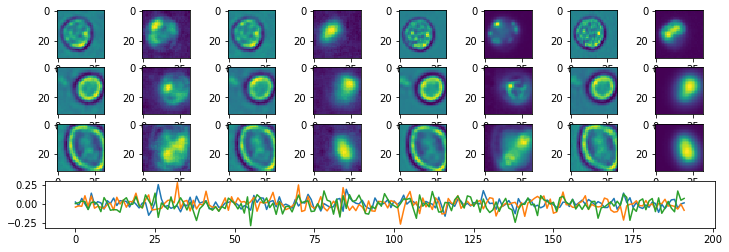

Epoch:  59 Iteration:  0 Loss:  2.99708 0.629733 0.000646651


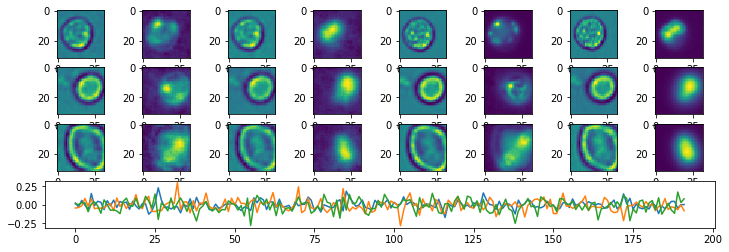

Epoch:  60 Iteration:  0 Loss:  2.98539 0.629728 0.00047493


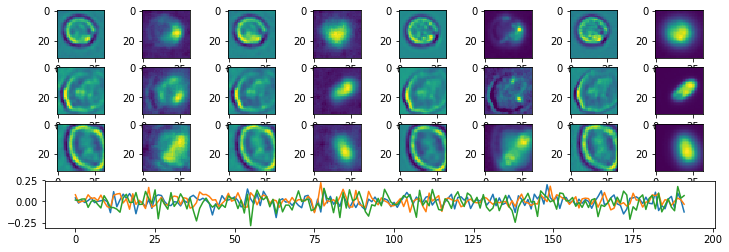

Epoch:  61 Iteration:  0 Loss:  3.01246 0.629741 0.000608832


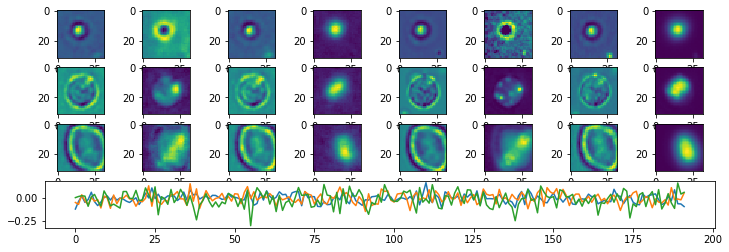

Epoch:  62 Iteration:  0 Loss:  2.95411 0.629711 0.000364065


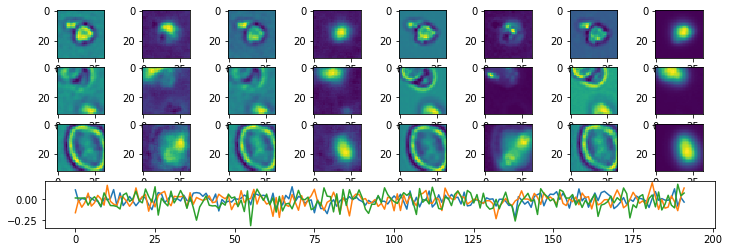

Epoch:  63 Iteration:  0 Loss:  2.94901 0.629708 0.000246137


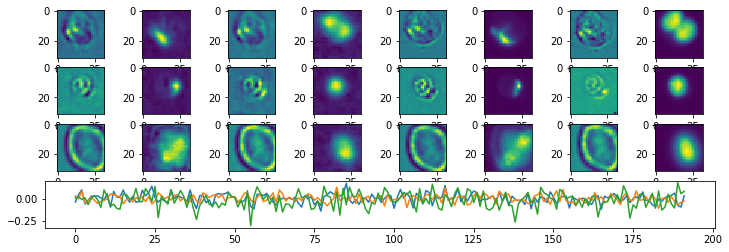

Epoch:  64 Iteration:  0 Loss:  2.90021 0.629683 0.000431299


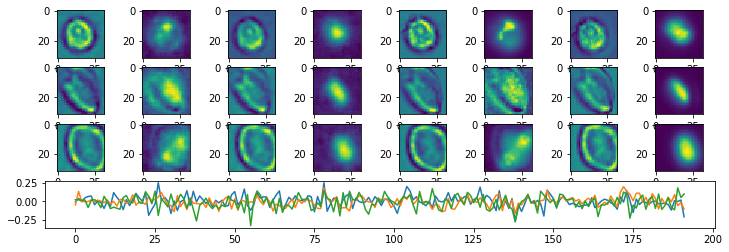

Epoch:  65 Iteration:  0 Loss:  2.91388 0.629689 4.46737e-05


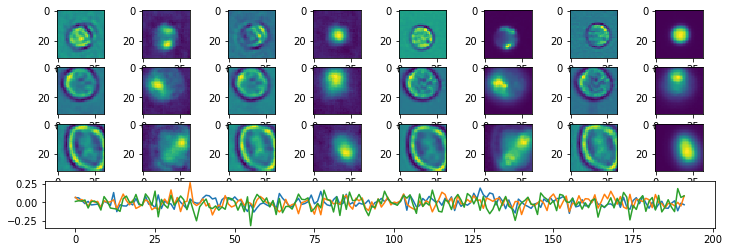

Epoch:  66 Iteration:  0 Loss:  2.8606 0.629663 0.000324339


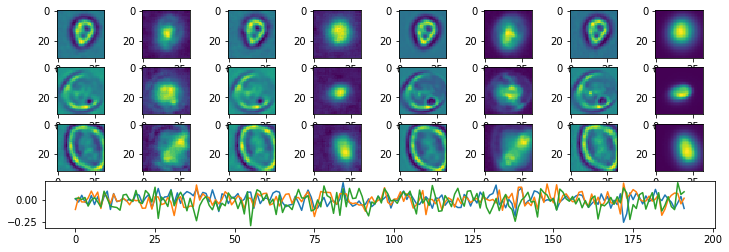

Epoch:  67 Iteration:  0 Loss:  2.82902 0.629647 0.000277638


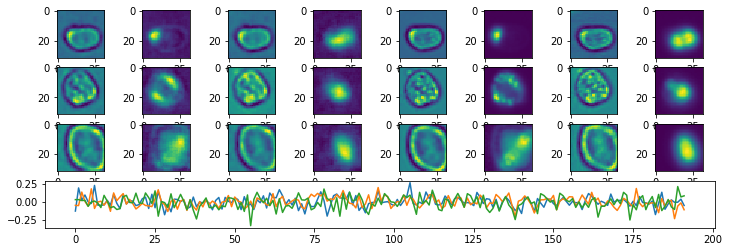

Epoch:  68 Iteration:  0 Loss:  3.58222 0.630041 0.000917375


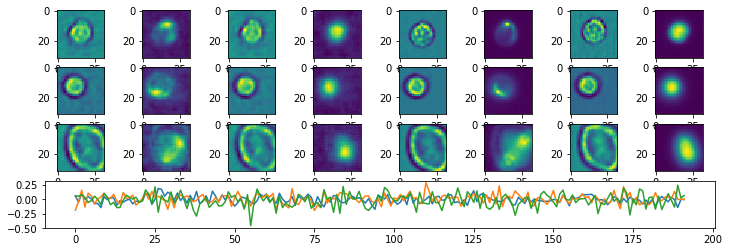

Epoch:  69 Iteration:  0 Loss:  3.13985 0.629809 0.000566006


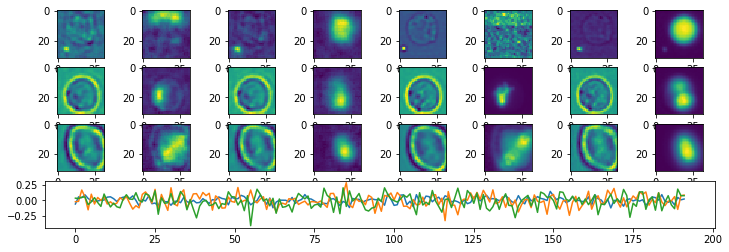

Epoch:  70 Iteration:  0 Loss:  3.02583 0.629749 0.000413418


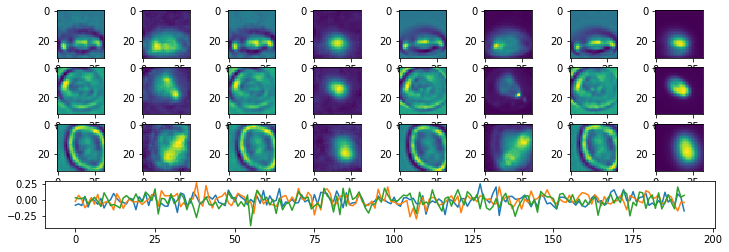

Epoch:  71 Iteration:  0 Loss:  2.96084 0.629715 0.000349611


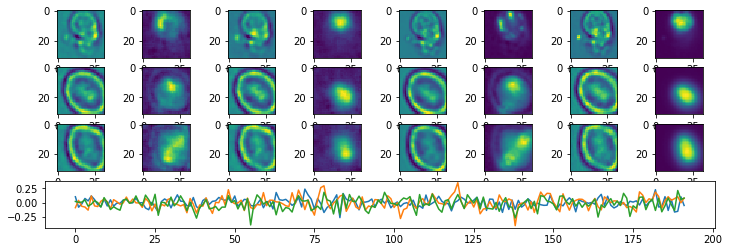

Epoch:  72 Iteration:  0 Loss:  2.95746 0.629713 0.00040704


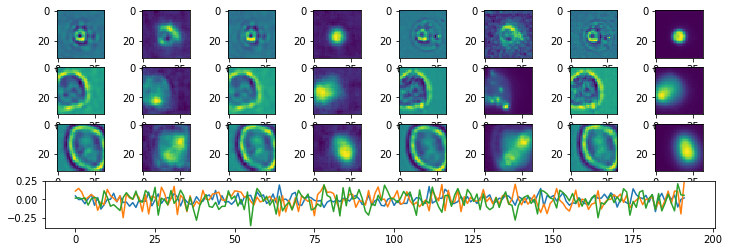

Epoch:  73 Iteration:  0 Loss:  2.90757 0.629688 0.00046882


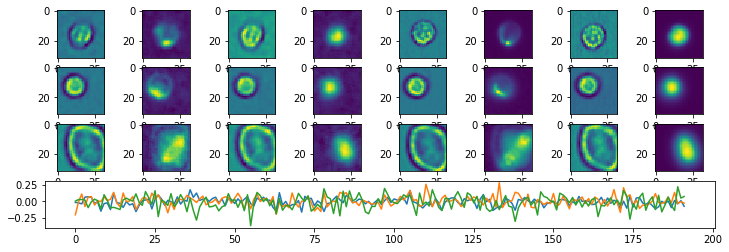

Epoch:  74 Iteration:  0 Loss:  2.89248 0.62968 0.000460088


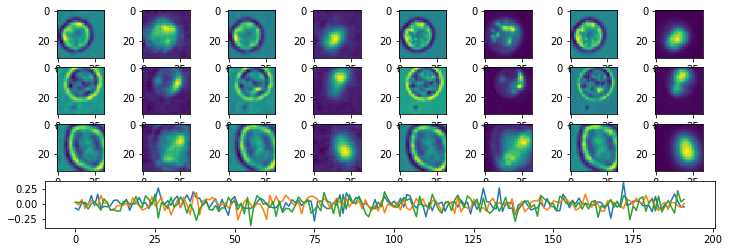

Epoch:  75 Iteration:  0 Loss:  2.87031 0.629668 0.000453413


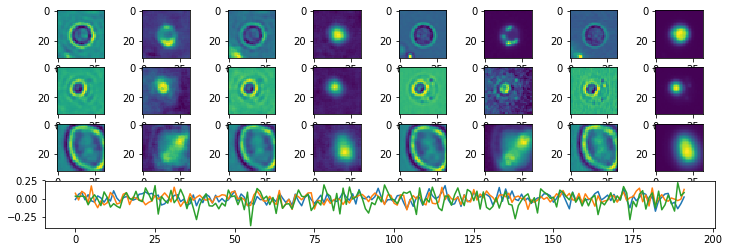

Epoch:  76 Iteration:  0 Loss:  2.88087 0.629674 0.000395685


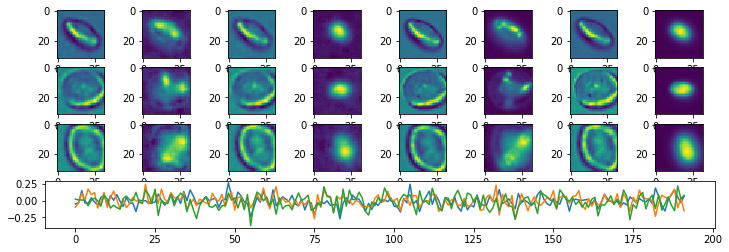

Epoch:  77 Iteration:  0 Loss:  2.84337 0.629655 0.000420064


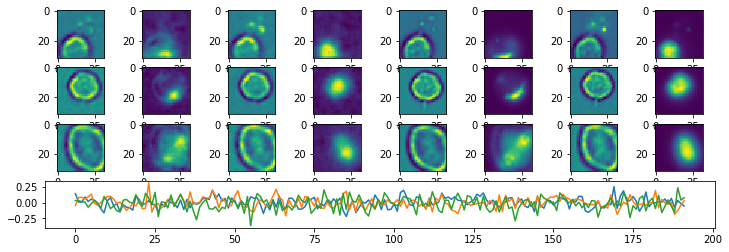

Epoch:  78 Iteration:  0 Loss:  2.8278 0.629647 0.000372201


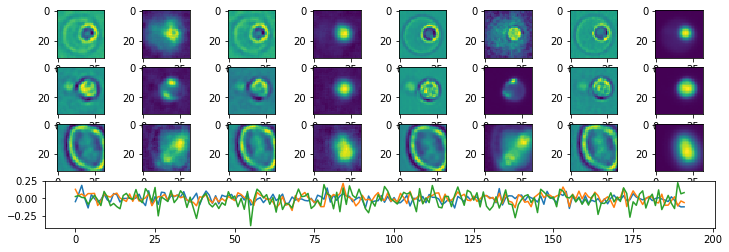

Epoch:  79 Iteration:  0 Loss:  2.86081 0.629664 0.000388861


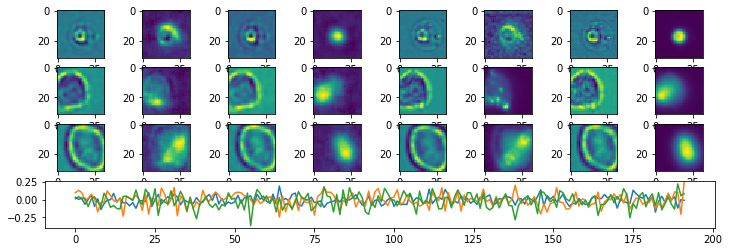

Epoch:  80 Iteration:  0 Loss:  2.83435 0.629649 0.000408143


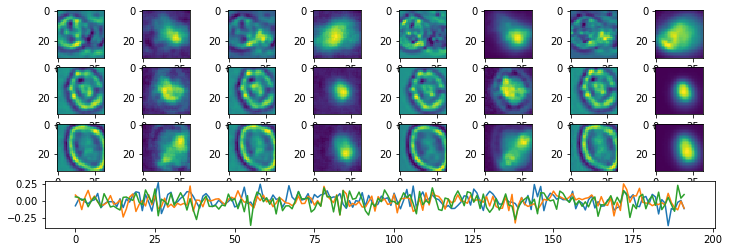

Epoch:  81 Iteration:  0 Loss:  2.83024 0.629648 0.000389606


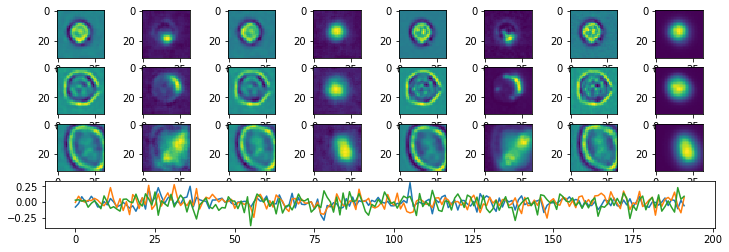

Epoch:  82 Iteration:  0 Loss:  2.81621 0.62964 0.000529647


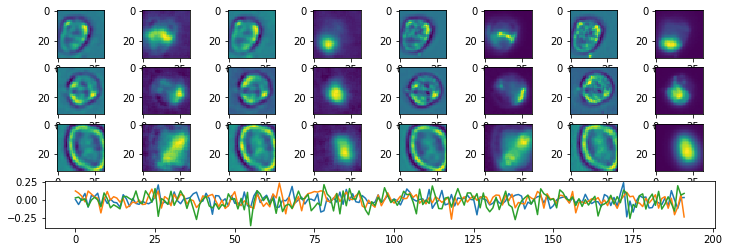

Epoch:  83 Iteration:  0 Loss:  2.79439 0.629629 0.000378698


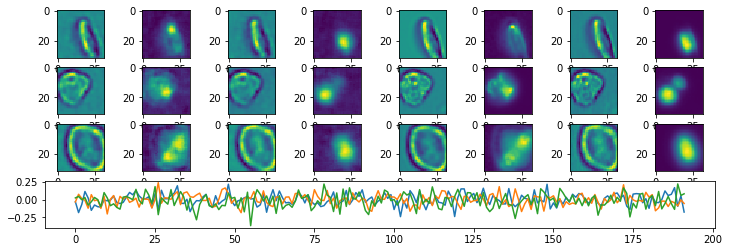

Epoch:  84 Iteration:  0 Loss:  2.78892 0.629626 0.000428885


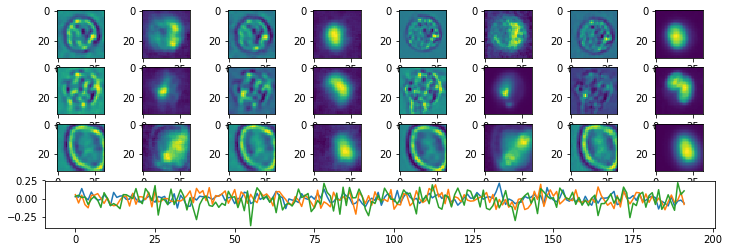

Epoch:  85 Iteration:  0 Loss:  2.77939 0.629621 0.00039497


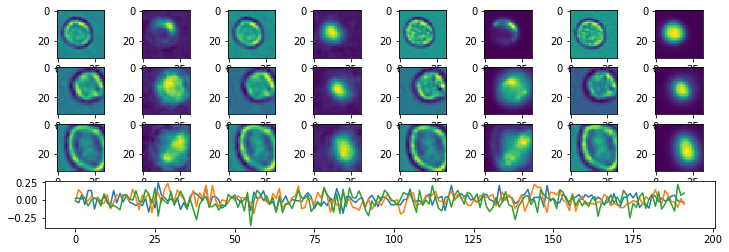

Epoch:  86 Iteration:  0 Loss:  2.75923 0.629611 0.00018692


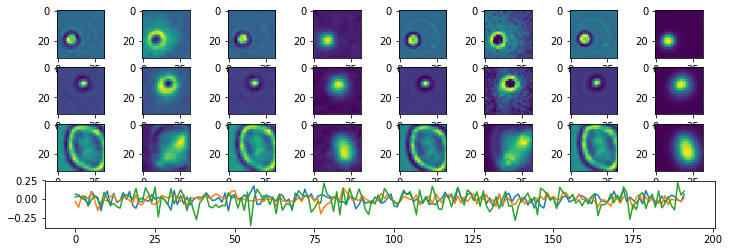

Epoch:  87 Iteration:  0 Loss:  2.77029 0.629617 0.000367701


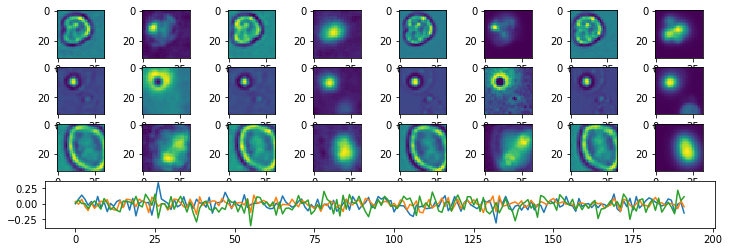

Epoch:  88 Iteration:  0 Loss:  2.75039 0.629607 0.000405103


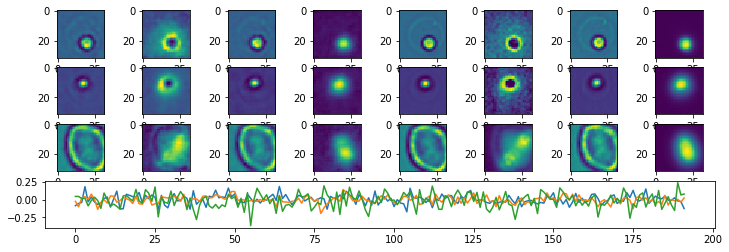

Epoch:  89 Iteration:  0 Loss:  2.74156 0.629602 0.000362456


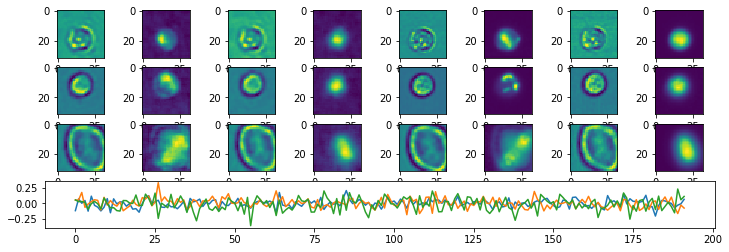

Epoch:  90 Iteration:  0 Loss:  2.73934 0.629601 0.000143945


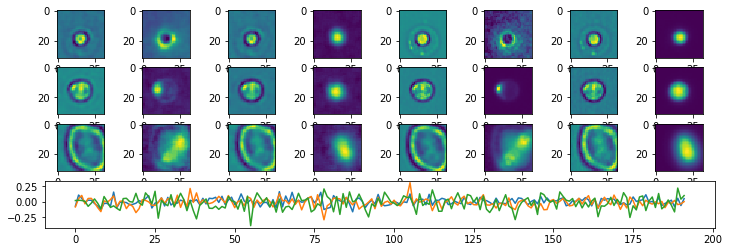

Epoch:  91 Iteration:  0 Loss:  2.73835 0.629602 0.000218302


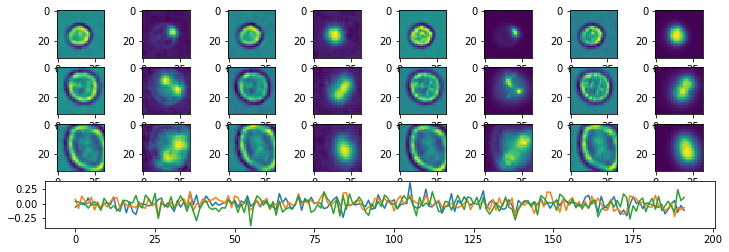

Epoch:  92 Iteration:  0 Loss:  2.71248 0.629587 0.00031516


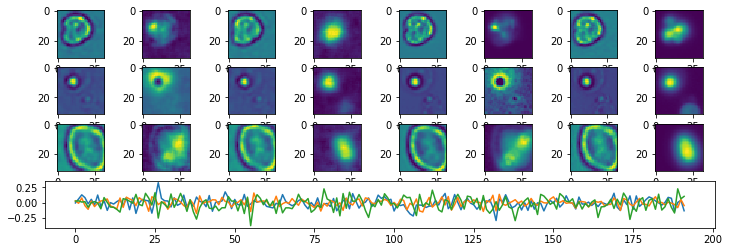

Epoch:  93 Iteration:  0 Loss:  2.69897 0.62958 0.000444114


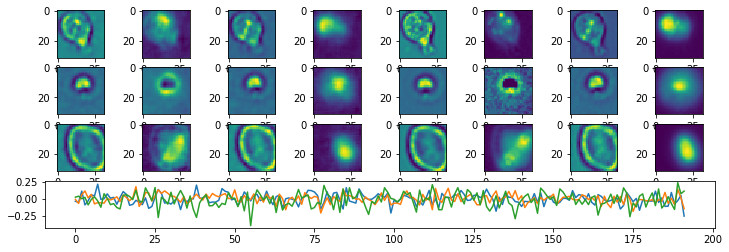

Epoch:  94 Iteration:  0 Loss:  2.68629 0.629574 0.000422001


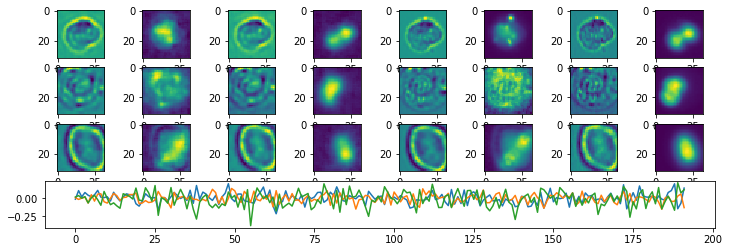

Epoch:  95 Iteration:  0 Loss:  2.65584 0.629558 0.000408471


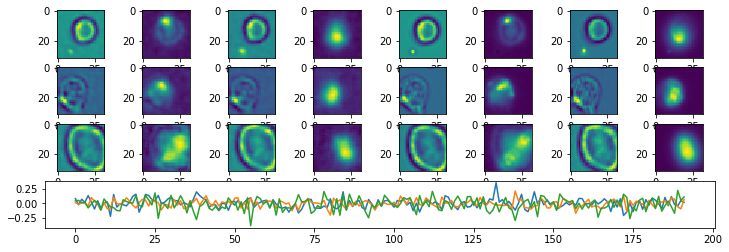

Epoch:  96 Iteration:  0 Loss:  2.69673 0.62958 0.000507027


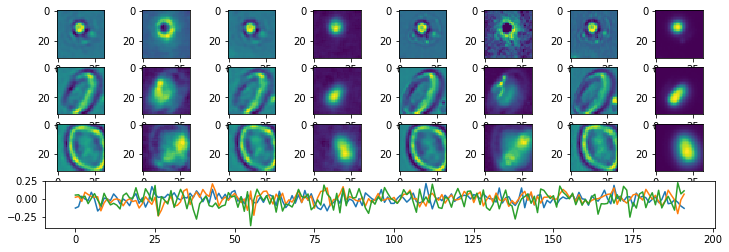

Epoch:  97 Iteration:  0 Loss:  2.64682 0.629554 0.00044471


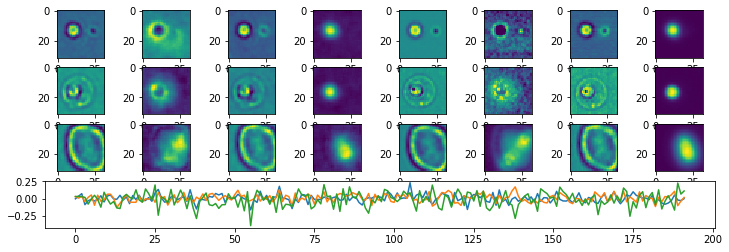

Epoch:  98 Iteration:  0 Loss:  2.62605 0.629545 0.000516295


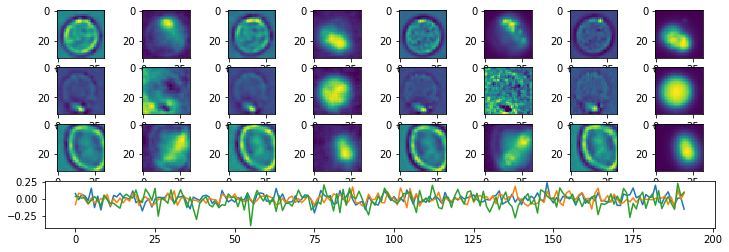

Epoch:  99 Iteration:  0 Loss:  2.71458 0.62959 0.00050965


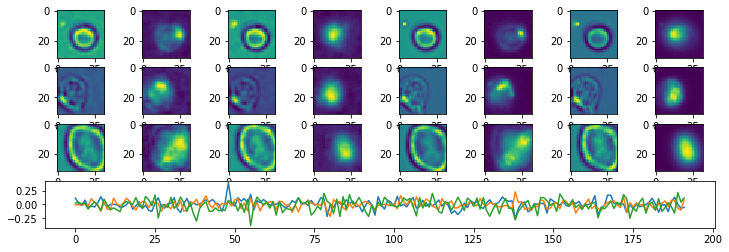

Epoch:  100 Iteration:  0 Loss:  2.63756 0.629548 0.000643373


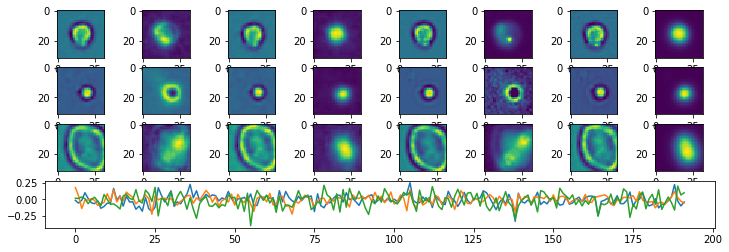

Epoch:  101 Iteration:  0 Loss:  2.62278 0.629541 0.000588328


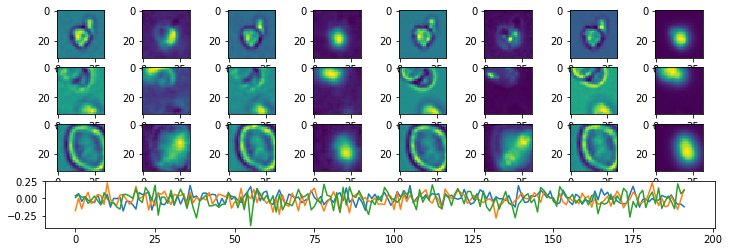

Epoch:  102 Iteration:  0 Loss:  3.5535 0.63003 0.000790834


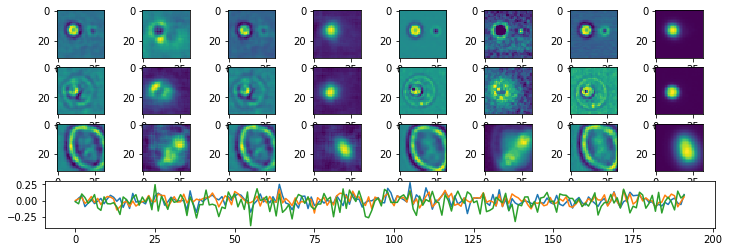

Epoch:  103 Iteration:  0 Loss:  3.16557 0.629825 0.000661761


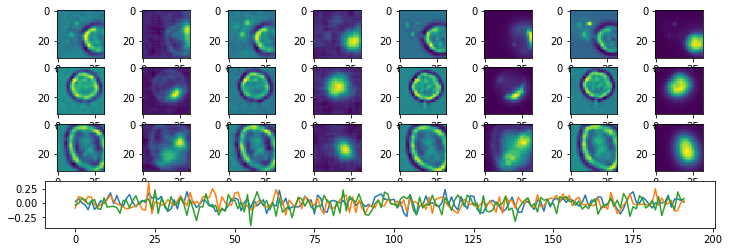

Epoch:  104 Iteration:  0 Loss:  3.06981 0.629776 0.000460565


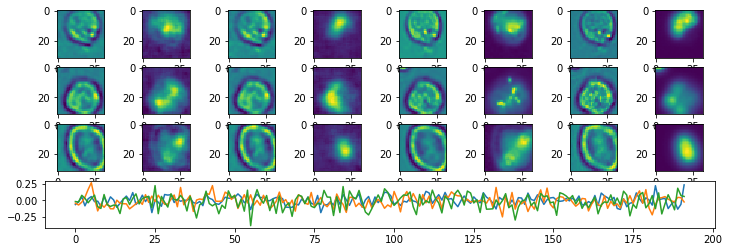

Epoch:  105 Iteration:  0 Loss:  2.98605 0.629732 0.000309229


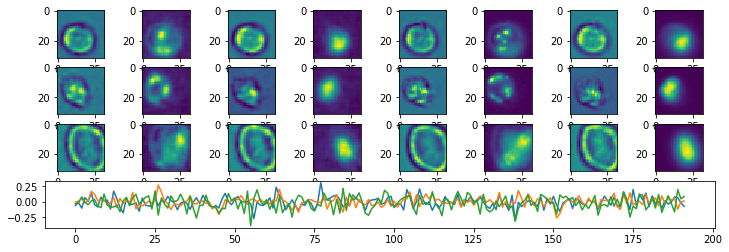

Epoch:  106 Iteration:  0 Loss:  2.92047 0.629697 0.000337809


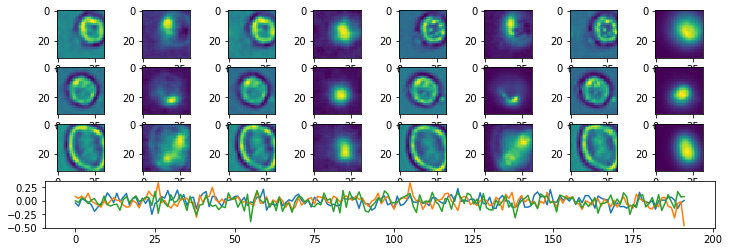

Epoch:  107 Iteration:  0 Loss:  2.87141 0.629671 0.000458926


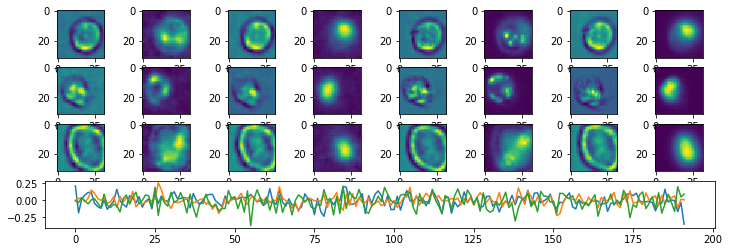

Epoch:  108 Iteration:  0 Loss:  2.84207 0.629657 0.000469208


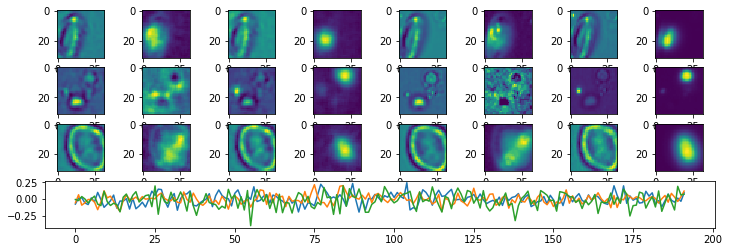

Epoch:  109 Iteration:  0 Loss:  2.82427 0.629646 0.000321984


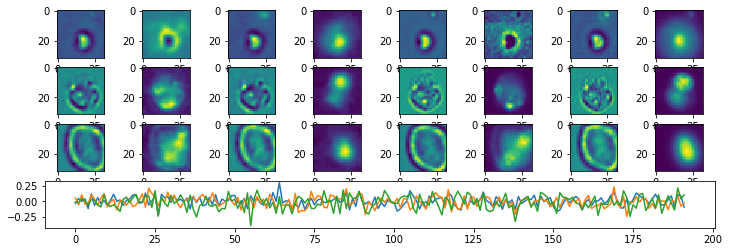

Epoch:  110 Iteration:  0 Loss:  2.79101 0.629629 0.000301927


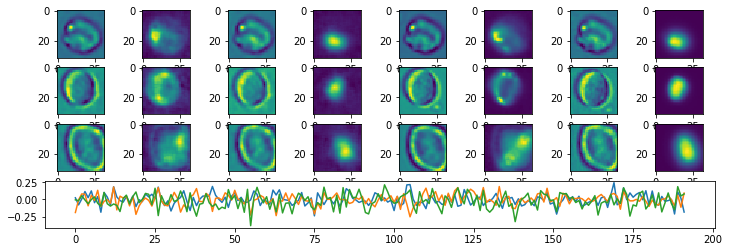

Epoch:  111 Iteration:  0 Loss:  2.78974 0.629628 0.000458121


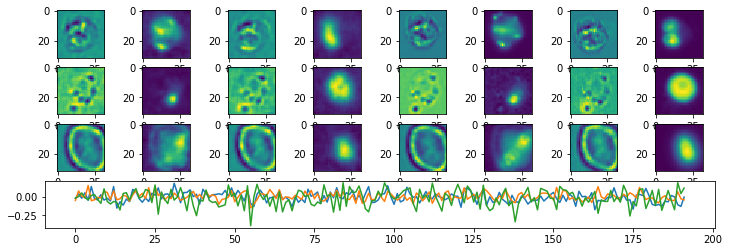

Epoch:  112 Iteration:  0 Loss:  2.75523 0.62961 0.000342011


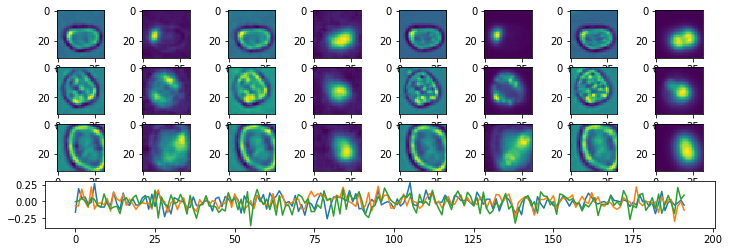

Epoch:  113 Iteration:  0 Loss:  2.74239 0.629605 0.000438839


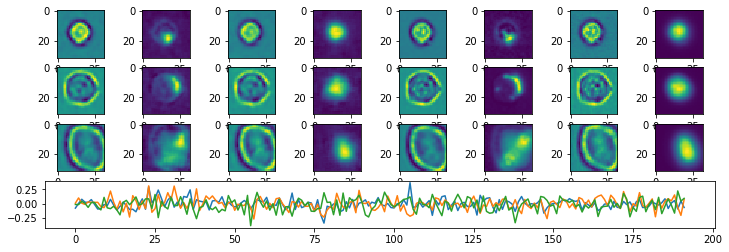

Epoch:  114 Iteration:  0 Loss:  2.69984 0.629583 0.000346154


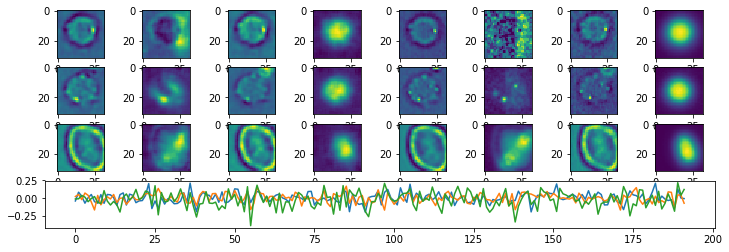

Epoch:  115 Iteration:  0 Loss:  2.71074 0.629587 0.000373542


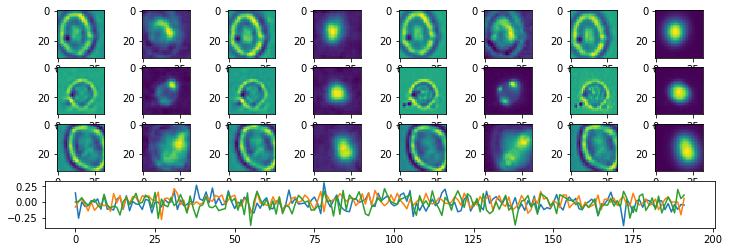

Epoch:  116 Iteration:  0 Loss:  2.67579 0.629572 0.000306726


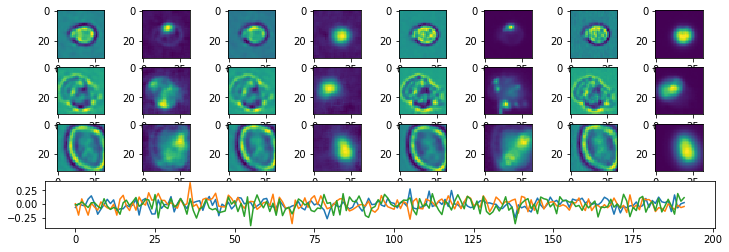

Epoch:  117 Iteration:  0 Loss:  2.67597 0.629576 0.000387907


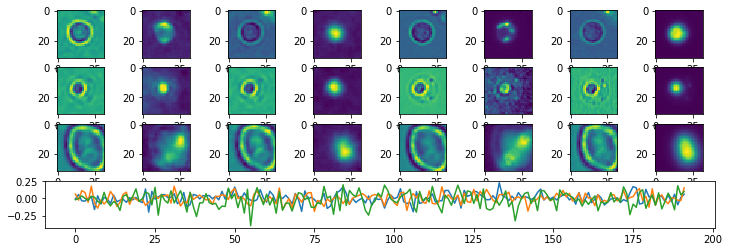

Epoch:  118 Iteration:  0 Loss:  2.6574 0.62956 0.000346482


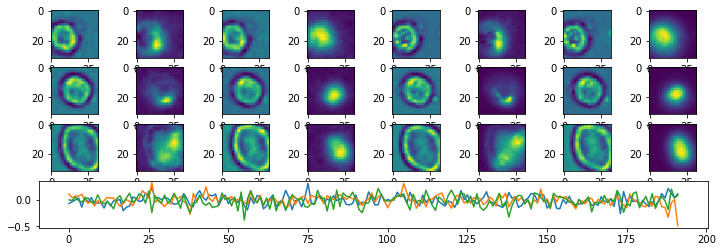

Epoch:  119 Iteration:  0 Loss:  2.64994 0.629555 0.000333905


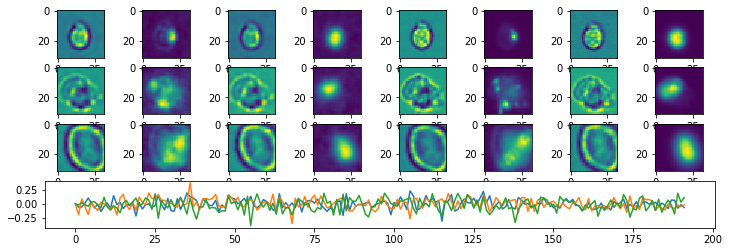

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 192 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-25-LS192"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4